# <a name="abstract">Titanic Machine Leaerning From Disaster</a>

**Abstract** The sinking of the RMS Titanic is one of the most infamous shipwrecks in history.  On April 15, 1912, during her maiden voyage, the Titanic sank after colliding with an iceberg, killing 1502 out of 2224 passengers and crew. This sensational tragedy shocked the international community and led to better safety regulations for ships.

One of the reasons that the shipwreck led to such loss of life was that there were not enough lifeboats for the passengers and crew. Although there was some element of luck involved in surviving the sinking, some groups of people were more likely to survive than others, such as women, children, and the upper-class.

In this challenge, we ask you to complete the analysis of what sorts of people were likely to survive. In particular, we ask you to apply the tools of machine learning to predict which passengers survived the tragedy.

In [204]:
using DataFrames
using Gadfly
using GLM, DecisionTree
using MLBase
using Iterators
importall Gadfly

In [3]:
quick_menu = """
<div style="float:right; position:fixed; top:120px; left:85%; background-color:#f0e7e7; opacity:.75;
            padding:2px; color:#3b5998;">
        <b>Quick Menu</b>
        <ul>
            <li><a href="#abstract">Intro</a></li>
            <li><a href="#load_data">Load Data</a></li>
            <li><a href="#var_class">Var Class</a></li>
            <li><a href="#univar_analysis">Univariate A.</a></li>
            <li><a href="#multivar_analysis">Multivariate A.</a></li>
            <li><a href="#reg_analysis">Regression A.</a></li>
        <ul>
    </div>
"""
HTML(quick_menu)

HTML{ASCIIString}("<div style=\"float:right; position:fixed; top:120px; left:85%; background-color:#f0e7e7; opacity:.75;\n            padding:2px; color:#3b5998;\">\n        <b>Quick Menu</b>\n        <ul>\n            <li><a href=\"#abstract\">Intro</a></li>\n            <li><a href=\"#load_data\">Load Data</a></li>\n            <li><a href=\"#var_class\">Var Class</a></li>\n            <li><a href=\"#univar_analysis\">Univariate A.</a></li>\n            <li><a href=\"#multivar_analysis\">Multivariate A.</a></li>\n            <li><a href=\"#reg_analysis\">Regression A.</a></li>\n        <ul>\n    </div>\n")

# <a name="load_data">Load Data</a>

In [4]:
train = readtable("data/train.csv")
test = readtable("data/test.csv");

# Exploratory Data Analysis

## Data Description

Data Size:

In [5]:
size(train)

(891,12)

Columns names, types and missing data:

In [6]:
showcols(train)

891x12 DataFrames.DataFrame
| Col #

Show first lines:

In [7]:
head(train)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
1,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.25,NA,S
2,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38.0,1,0,PC 17599,71.2833,C85,C
3,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.925,NA,S
4,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1,C123,S
5,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.05,NA,S
6,6,0,3,"Moran, Mr. James",male,NA,0,0,330877,8.4583,NA,Q


 | Name        | Eltype     | Missing |
|-------|-------------|------------|---------|
| 1     | PassengerId | Int64      | 0       |
| 2     | Survived    | Int64      | 0       |
| 3     | Pclass      | Int64      | 0       |
| 4     | Name        | UTF8String | 0       |
| 5     | Sex         | UTF8String | 0       |
| 6     | Age         | Float64    | 177     |
| 7     | SibSp       | Int64      | 0       |
| 8     | Parch       | Int64      | 0       |
| 9     | Ticket      | UTF8String | 0       |
| 10    | Fare        | Float64    | 0       |
| 11    | Cabin       | UTF8String | 687     |
| 12    | Embarked    | UTF8String | 2       |

## <a href="#var_class">Variable Classification</a>

To conduct proper data analysis a good strategy is to segregate the variables by it's type and subtype. Exists made forms of perform it. As a initial data exploration, we can adopt `Numerical`, `Categorical` and `Textual` data classification.

#### Numerical Variables

In [8]:
numerical_vars = [:Age, :Fare]

2-element Array{Symbol,1}:
 :Age 
 :Fare

#### Categorical Variables

In [9]:
categorical_vars = [:PassengerId, :Survived, :Pclass, :Sex, :SibSp, :Parch, :Cabin, :Embarked]

8-element Array{Symbol,1}:
 :PassengerId
 :Survived   
 :Pclass     
 :Sex        
 :SibSp      
 :Parch      
 :Cabin      
 :Embarked   

#### Textual Variables

In [10]:
textual_vars = [:Name, :Ticket]

2-element Array{Symbol,1}:
 :Name  
 :Ticket

## <a name="univar_analysis">Univariate Analysis</a>

### Distribution Analysis

  likely near In[11]:2
  likely near In[11]:2
  likely near In[11]:2
in set_mapped_data! at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:275
  likely near In[11]:2
  likely near In[11]:2
  likely near In[11]:2
in __call#41__ at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
  likely near In[11]:2
in __call#41__ at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
  likely near In[11]:2
in __call#41__ at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in vstack at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:890
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /Users/diego/.jul

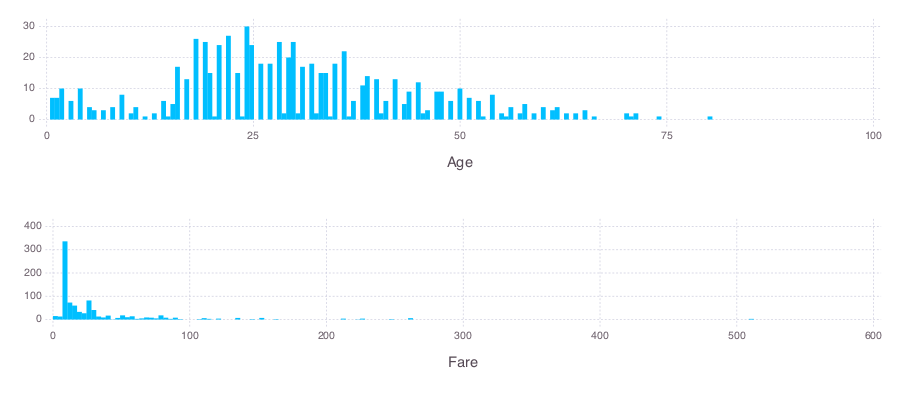

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in vstack at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:890
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading In[11], in expression starting on line 2
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in vstack at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:890
 in

In [11]:
set_default_plot_size(900px, 400px)
vstack(plot(train, x=:Age, Geom.histogram), plot(train, x=:Fare, Geom.histogram))

The histogram was created to analyze the numerical data. As we can observes  for `Fare` variable, we observes outliers. They may represents passagers that went to first class and are the minority. It is good to explore these passagers more properly since that they have non-convential behavior in the data and can lead to degraded results in your future models.

In [12]:
size_outliers = round(size(train[train[:Fare] .> 100, :], 1)/size(train, 1), 2)

0.06

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:918
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:29
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

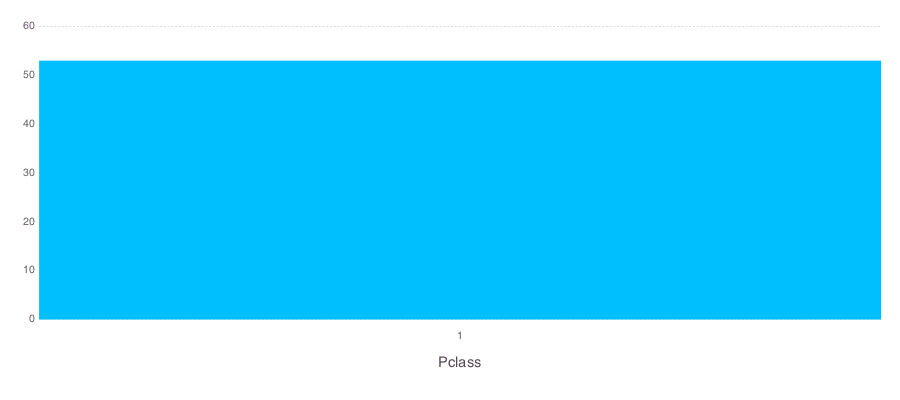

In [13]:
plot(train[train[:Fare] .> 100, [:Pclass]], x=:Pclass, Scale.x_discrete, Geom.histogram)

This shows that for `Fare` > 100 we only have 1st class passagers. Then, we cannot discarded as intented.

### Missing Data Analysis

display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:39
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
  likely near In[14]:3
  likely near In[14]:3
  likely near In[14]:3
  likely near In[14]:3
  likely near In[14]:3
in set_mapped_data! at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:275
  likely near In[14]:3
in set_mapped_data! at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:275
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4

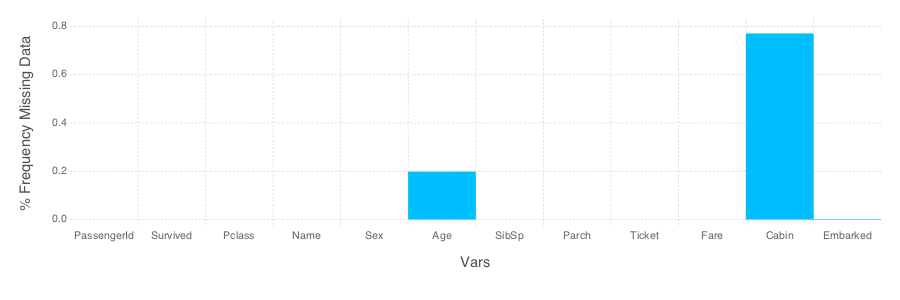

In [14]:
missing_data = vcat(colwise(c -> sum(DataArray{Int8}(isna(c)))/size(train,1), train)...)
set_default_plot_size(900px, 300px)
plot(x=names(train), y=missing_data, Scale.x_discrete, Geom.bar, 
     Guide.xlabel("Vars"), Guide.ylabel("% Frequency Missing Data"))

### Unique Values Analysis

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in draw at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:885
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:926
 in base64encode at base64.jl:160
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:32
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /

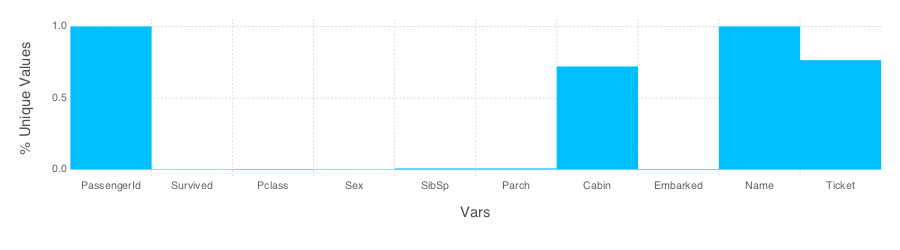

In [15]:
vars = vcat(categorical_vars, textual_vars)
variance_data = vcat(colwise(c -> length(Set(dropna(c)))/length(dropna(c)), train[:, vars])...);
set_default_plot_size(900px, 250px)
plot(x=vars, y=variance_data, Scale.x_discrete, Geom.bar, 
     Guide.xlabel("Vars"), Guide.ylabel("% Unique Values"))

After the analysis of missing and unique data we can define that `PassgerId`, `Cabin`, `Name`, and `Ticked` will be eliminated and will not be used for further analysis and model generation.

In [44]:
selected_vars = [:Age, :Fare, :Survived, :Pclass, :Sex, :SibSp, :Parch, :Embarked]

8-element Array{Symbol,1}:
 :Age     
 :Fare    
 :Survived
 :Pclass  
 :Sex     
 :SibSp   
 :Parch   
 :Embarked

In [45]:
x_vars = [:Age, :Fare, :Pclass, :Sex, :SibSp, :Parch, :Embarked]
y_var = :Survived;

### <a name="multivar_analysis">Multivariate Analysis</a>

### Scatter Matrix Analysis

Now we will analyze the variable by pairs using a scatter matrix. First, we need to create the code use in here. I'll borrow from my other [notebook](https://github.com/dmoliveira/my-juliabox/blob/master/Data%20Analysis%20-%20Julia%20%2B%20Gadfly%20-%20Scatter-Matrix%20Example.ipynb) that has a proposition to Gadfly as new form of graph. Let's try in our selected variables. 

**\* Please ignore the warnings. You can hack your browser using F12 and add property display:none for div.output_stderr**

In [18]:
reshape_stack(plots, ncols) = vstack(map(i -> hstack(plots[i:i+(ncols-1)]...), 1:ncols:length(plots))...)

function scatter_matrix(dataframe)
    columns = names(dataframe)
    ncols = length(columns)
    
    plots = []
    sizehint!(plots, ncols^2)
    
    for i = 1:ncols, j = 1:ncols
        values = dataframe[:, vcat(columns[i], columns[j])]
        values = values[!isna(values[:,1]),:]
        values = values[!isna(values[:,2]),:]
        if i != j
            p = plot(values, x=columns[i], y=columns[j], Geom.point)
        else
            if eltype(values[:,columns[i]]) <: Number
                title = ""
                if eltype(values[:,columns[i]]) <: AbstractFloat
                    mean_value = round(mean(values[:,columns[i]]), 2)
                    stddev = round(std(values[:,columns[i]]), 2)
                    title = "μ=$mean_value,σ=$stddev"
                end
                p = plot(values, x=columns[i], Geom.histogram, 
                         Guide.title(title))
            else
                p = plot(values, x=columns[i], Stat.histogram, 
                         Scale.y_discrete, Scale.x_discrete, Geom.bar)
            end
        end
        push!(plots, p)
    end
    reshape_stack(plots, ncols)
end

scatter_matrix (generic function with 1 method)

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:909
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:39
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

  likely near In[19]:2
  likely near In[19]:2
  likely near In[19]:2
  likely near In[19]:2
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in hstack at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:895
 in anonymous at In[18]:1
 in map at abstractarray.jl:1279
 in reshape_stack at In[18]:1
 in scatter_matrix at In[18]:33
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading In[19], in expression starting on line 2
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/gui

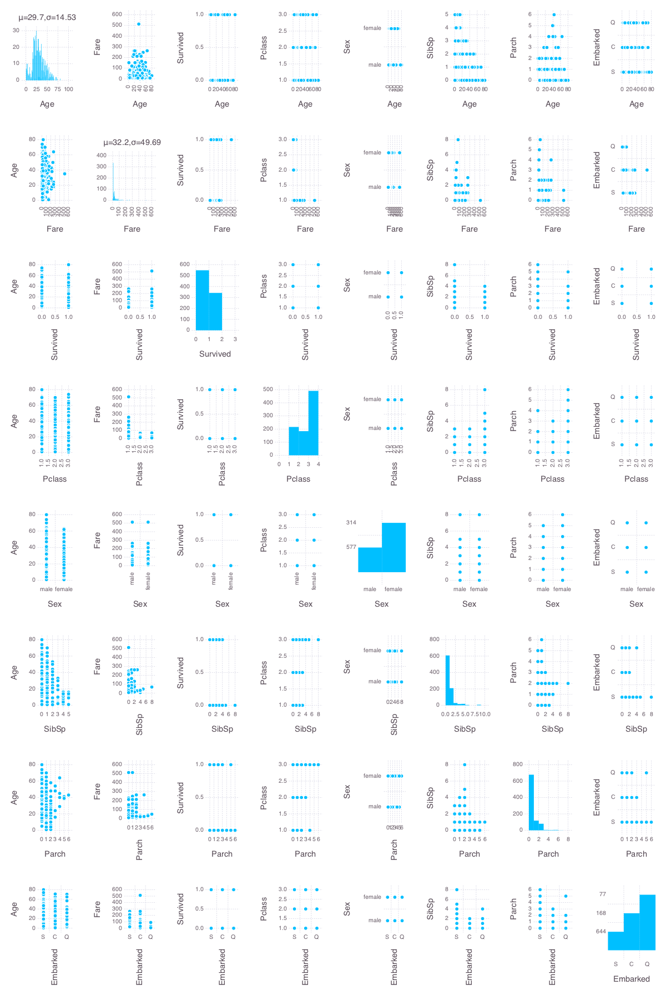

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in hstack at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:895
 in anonymous at In[18]:1
 in map_to! at abstractarray.jl:1260
 in map at abstractarray.jl:1282
 in reshape_stack at In[18]:1
 in scatter_matrix at In[18]:33
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading In[19], in expression starting on line 2
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.

In [19]:
set_default_plot_size(1200px, 1800px)
scatter_matrix(train[:, selected_vars])

### <a name="reg_analysis">Regression Analysis</a>

#### Preprocess data

In [46]:
train_cleaned = train[!isna(train[:Age]),:]
train_cleaned = train_cleaned[!isna(train_cleaned[:Embarked]),:]
sex_labels = labelmap(train_cleaned[:,:Sex])
embarked_labels = labelmap(train_cleaned[:,:Embarked])
train_cleaned[:Sex] = labelencode(sex_labels, train_cleaned[:, :Sex])
train_cleaned[:Embarked] = labelencode(embarked_labels, train_cleaned[:, :Embarked]);

#### Fill Missing Values

In [47]:
function warmup_missing_dict(dataframe, fixed_columns)
    input = aggregate(dataframe, fixed_columns, mean)
    return { join(Array(input[i,1:(end-1)]), "_") => input[i,end]  for i=1:size(input, 1) }
end

function fill_missing_values!(dataframe, fixed_columns, column_missing, input)
    for i=1:size(dataframe, 1)
        key = join(Array(dataframe[i, fixed_columns]), "_")
        if isna(dataframe[i, column_missing])
            dataframe[i, column_missing] = haskey(input, key)? input[key] : mean(dropna(dataframe[:,column_missing]))
        end
    end
    return dataframe
end


Use "Dict{Any,Any}([a=>b for (a,b) in c])" instead.


fill_missing_values! (generic function with 2 methods)

In [60]:
fixed_age_columns = [:Pclass, :Sex, :SibSp, :Parch, :Embarked]
fixed_embarked_columns = [:Pclass, :Sex, :SibSp, :Parch, :Age]
input_age = warmup_missing_dict(train_cleaned[:, vcat(fixed_age_columns, :Age)], fixed_age_columns)
input_embarked = warmup_missing_dict(train_cleaned[:, vcat(fixed_embarked_columns, :Embarked)], fixed_embarked_columns)
fill_missing_values!(train_cleaned, fixed_age_columns, :Age, input_age)
fill_missing_values!(train_cleaned, fixed_embarked_columns, :Embarked, input_embarked);

#### Model Generation

In [61]:
# Automatically Generate All Features first-order interaction from Simple to Multiple Regression
formulas = map(x -> parse(string(y_var, "~", join(x, "+"))), collect(subsets(x_vars)))[2:end];
linear_models = map(formula -> glm(eval(formula), train_cleaned, Binomial()), formulas)

127-element Array{DataFrames.DataFrameRegressionModel{GLM.GeneralizedLinearModel{GLM.GlmResp{Array{Float64,1},Distributions.Binomial,GLM.LogitLink},GLM.DensePredChol{Float64,Base.LinAlg.Cholesky{Float64,Array{Float64,2}}}},Float64},1}:
 DataFrames.DataFrameRegressionModel{GLM.GeneralizedLinearModel{GLM.GlmResp{Array{Float64,1},Distributions.Binomial,GLM.LogitLink},GLM.DensePredChol{Float64,Base.LinAlg.Cholesky{Float64,Array{Float64,2}}}},Float64}:

Coefficients:
               Estimate  Std.Error   z value Pr(>|z|)
(Intercept)  -0.0411694   0.174052 -0.236536   0.8130
Age          -0.0117566 0.00536203  -2.19257   0.0283
                                                                                                                                                                                                                                                                                                                                    
 DataFrames.DataFrameRegressionModel{GLM.Gener

#### Evaluate Regressions

In [62]:
binarize(y) = DataArray{Int8}(y .>= .5)
accuracy(linear_model, x, y) = round(sum(DataArray{Int8}(binarize(predict(linear_model, x)) .== y))/size(x,1), 2)
accuracy(linear_models::Array, x, y) = map(m -> accuracy(m, x, y), linear_models)

accuracy (generic function with 2 methods)

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:918
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:29
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

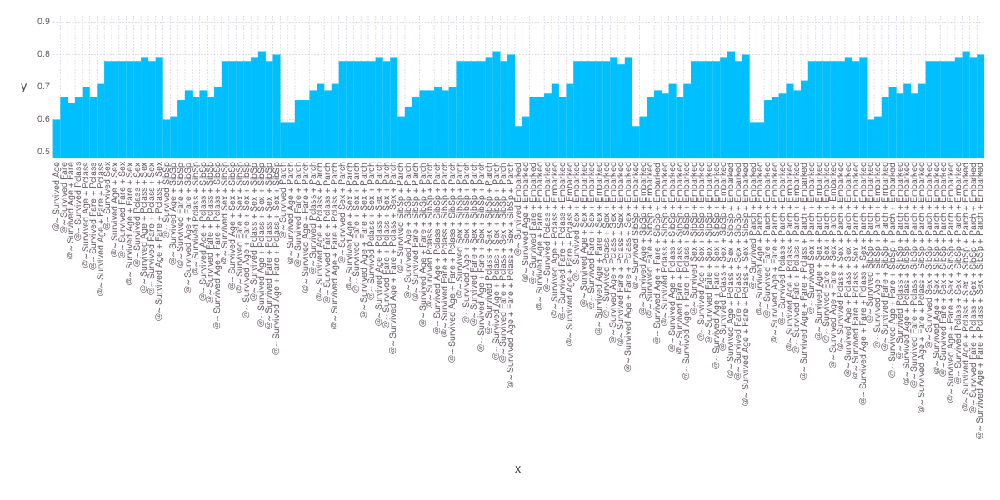

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:909
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:39
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

In [63]:
set_default_plot_size(1200px, 600px)
acc = accuracy(linear_models, train_cleaned[x_vars], train_cleaned[y_var])
plot(x=formulas, y=acc, Scale.x_discrete, Geom.bar)

In [64]:
best_acc = maximum(acc)
best_models_index = findin(acc, best_acc)
best_formulas = formulas[best_models_index]
println("Best Accuracy on training is: $best_acc")
println("Best Models Index: $best_models_index")
println("Best Models:\n$(join(best_formulas, "\n"))")

Best Accuracy on training is: 0.81
Best Models Index: [29,61,93,125]
Best Models:
@~ Survived Age + Pclass + Sex + SibSp
@~ Survived Age + Pclass + Sex + SibSp + Parch
@~ Survived Age + Pclass + Sex + SibSp + Embarked
@~ Survived Age + Pclass + Sex + SibSp + Parch + Embarked


### Test Prediction

Let's make some preprocessing in test set and generate the results for submission at Kaggle. First we need to solve missing data. For this let see what data are missing and try to input with correct strategy.

In [65]:
test_cleaned = test[:, x_vars]
test_cleaned[:Sex] = labelencode(sex_labels, test_cleaned[:, :Sex])
test_cleaned[:Embarked] = labelencode(embarked_labels, test_cleaned[:, :Embarked])
showcols(test_cleaned)

418x7 DataFrames.DataFrame
| Col # | Name     | Eltype  | Missing |
|-------|----------|---------|---------|
| 1     | Age      | Float64 | 0       |
| 2     | Fare     | Float64 | 0       |
| 3     | Pclass   | Int64   | 0       |
| 4     | Sex      | Int64   | 0       |
| 5     | SibSp    | Int64   | 0       |
| 6     | Parch    | Int64   | 0       |
| 7     | Embarked | Int64   | 0       |

In [66]:
fill_missing_values!(test_cleaned, fixed_age_columns, :Age, input_age)
fill_missing_values!(test_cleaned, fixed_embarked_columns, :Embarked, input_embarked);

### Prediction Results I: Multiple Logistic Regression

In [27]:
names(test)

11-element Array{Symbol,1}:
 :PassengerId
 :Pclass     
 :Name       
 :Sex        
 :Age        
 :SibSp      
 :Parch      
 :Ticket     
 :Fare       
 :Cabin      
 :Embarked   

In [67]:
prediction_dataframe = DataFrame(PassengerId=test[:PassengerId], Survived=binarize(predict(linear_models[29], test_cleaned)))
size(prediction_dataframe)

(418,2)

In [68]:
writetable("./data/prediction_v1_logistic_reg_model_29_input_improved.csv", prediction_dataframe)

<div style="background-color:#c1f5ba; color:#30b171; padding:5px;
            font-family:'Lucida Sans Unicode', 'Lucida Grande', sans-serif">
    Results from this submission on Kaggle: **0.75120**
</div>

### Prediction II: Decision Tree

#### Training Decision Tree

In [118]:
y = Array(train_cleaned[:,y_var])
x = Array(train_cleaned[:,[:Age, :Pclass, :Sex, :SibSp]]);

In [119]:
dt_model = build_tree(y, x)

Decision Tree
Leaves: 159
Depth:  16

In [120]:
dt_model = prune_tree(dt_model, 0.9)

Decision Tree
Leaves: 152
Depth:  16

In [121]:
print_tree(dt_model, 3)

Feature 3, Threshold 2
L-> Feature 2, Threshold 2
    L-> Feature 1, Threshold 54.0
        L-> 
        R-> 
    R-> Feature 1, Threshold 10.0
        L-> 
        R-> 
R-> Feature 2, Threshold 3
    L-> Feature 1, Threshold 3.0
        L-> 
        R-> 
    R-> Feature 1, Threshold 39.0
        L-> 
        R-> 0 : 11/12


In [124]:
acc = nfoldCV_tree(y, x, 0.9, 5)


Fold 1

2x2 Array{Int64,2}:
 70  15
 13  44

2x2 Array{Int64,2}:
 63  11
 25  43

2x2 Array{Int64,2}:
 65  16
 21  40

2x2 Array{Int64,2}:
 80   8
 19  35


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8028169014084507
Kappa:    0.5920377590806486

Fold 2
Classes:  Any[0,1]
Matrix:   
Accuracy: 0.7464788732394366
Kappa:    0.48777555110220444

Fold 3
Classes:  Any[0,1]
Matrix:   
Accuracy: 0.7394366197183099
Kappa:    0.4628910243304028

Fold 4
Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8098591549295775
Kappa:    0.580065717415115

Fold 5

2x2 Array{Int64,2}:
 84  11
 14  33

5-element Array{Float64,1}:
 0.802817
 0.746479
 0.739437
 0.809859
 0.823944


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.823943661971831
Kappa:    0.5959480992488049

Mean Accuracy: 0.7845070422535212


#### Test Decision Tree

In [110]:
prediction_dataframe = DataFrame(PassengerId=test[:PassengerId], Survived=apply_tree(dt_model, Array(test_cleaned)));

In [111]:
size(prediction_dataframe)

(418,2)

In [112]:
writetable("./data/prediction_v2_decision_tree_model_gini.9.csv", prediction_dataframe)

<div style="background-color:#c1f5ba; color:#30b171; padding:5px;
            font-family:'Lucida Sans Unicode', 'Lucida Grande', sans-serif">
    Results from this submission on Kaggle: **0.67943**
</div>

### Prediction III: Decision Tree ~ Best from all combinations

#### Training Decision Tree with Best Model

In [136]:
function training_decision_tree(dataframe, x_vars, y_var)
    y = Array(dataframe[:,y_var])
    features_combination = collect(subsets(x_vars))[2:end]
    results = []
    sizehint!(results, size(features_combination, 1))
    for features in features_combination
        x = Array(dataframe[:, features])
        dt_model = build_tree(y, x)
        dt_model = prune_tree(dt_model, 0.9)
        y_pred = apply_tree(dt_model, x)
        acc = round(sum(Array{Int8}(y .== y_pred))/length(y_pred), 2)
        push!(results, (features, dt_model, acc))
    end
    return results
end

training_decision_tree (generic function with 1 method)

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:918
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:29
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

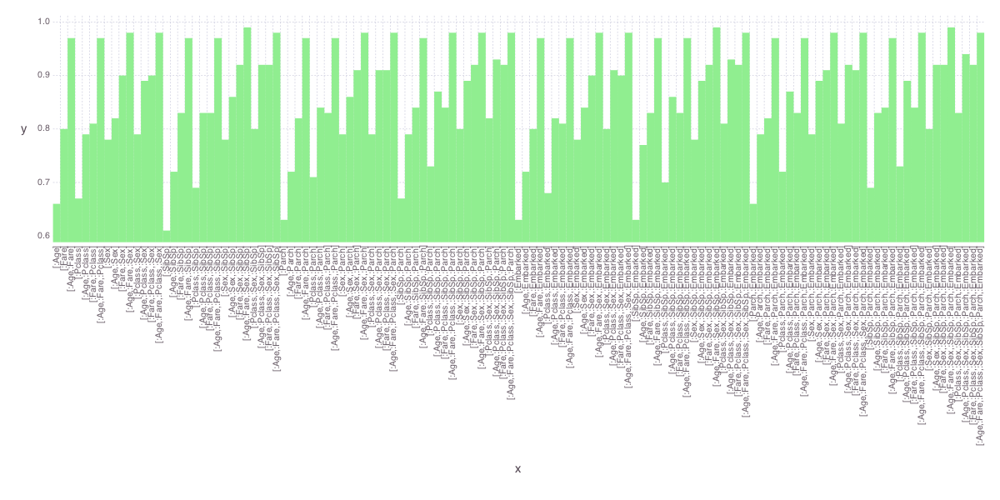

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:909
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:39
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

In [144]:
results = training_decision_tree(train_cleaned, x_vars, y_var)
features = [features for (features, dt_model, acc) in results]
dt_models = [dt_model for (features, dt_model, acc) in results]
accs = [acc for (features, dt_model, acc) in results]
plot(x=features, y=accs, Scale.x_discrete, Geom.bar, Theme(default_color=colorant"lightgreen"))

In [142]:
best_acc = maximum(accs)
best_models_index = findin(accs, best_acc)
best_formulas = formulas[best_models_index]
println("Best Accuracy on training is: $best_acc")
println("Best Models Index: $best_models_index")
println("Best Models:\n$(join(best_formulas, "\n"))")

Best Accuracy on training is: 0.99
Best Models Index: [27,91,123]
Best Models:
@~ Survived Age + Fare + Sex + SibSp
@~ Survived Age + Fare + Sex + SibSp + Embarked
@~ Survived Age + Fare + Sex + SibSp + Parch + Embarked


#### Test Decision Tree

In [171]:
prediction_dataframe = DataFrame(PassengerId=test[:PassengerId], Survived=apply_tree(dt_models[27], Array(test_cleaned)));

In [146]:
size(prediction_dataframe)

(418,2)

In [172]:
writetable("./data/prediction_v2_decision_tree_best_model_gini.9.csv", prediction_dataframe)

<div style="background-color:#c1f5ba; color:#30b171; padding:5px;
            font-family:'Lucida Sans Unicode', 'Lucida Grande', sans-serif">
    Results from this submission on Kaggle: **0.49282**
</div>

### Prediction IV: Random Forest

#### Training Random Forest

In [154]:
model = build_forest(y, x, 2, 10, 0.5)
accuracy = nfoldCV_forest(y, x, 2, 10, 5, 0.5)


Fold 1

2x2 Array{Int64,2}:
 77   1
 24  40

2x2 Array{Int64,2}:
 85  11
 16  30


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.823943661971831
Kappa:    0.632581246118816

Fold 2
Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8098591549295775
Kappa:    0.5532509904451178

Fold 3

2x2 Array{Int64,2}:
 74  11
 23  34

2x2 Array{Int64,2}:
 83   7
 12  40


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.7605633802816901
Kappa:    0.48385717340175327

Fold 4
Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8661971830985915
Kappa:    0.7057797164667393

Fold 5

2x2 Array{Int64,2}:
 74   0
 27  41

LoadError: LoadError: invalid redefinition of constant accuracy
while loading In[154], in expression starting on line 2


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8098591549295775
Kappa:    0.6128054938396283

Mean Accuracy: 0.8140845070422535


#### Test Random Forest

In [156]:
prediction_dataframe = DataFrame(PassengerId=test[:PassengerId], Survived=apply_forest(model, Array(test_cleaned)));

In [157]:
size(prediction_dataframe)

(418,2)

In [158]:
writetable("./data/prediction_v2_random_forest_2_feat_10_trees_.5proportion.csv", prediction_dataframe)

<div style="background-color:#c1f5ba; color:#30b171; padding:5px;
            font-family:'Lucida Sans Unicode', 'Lucida Grande', sans-serif">
    Results from this submission on Kaggle: **0.55024**
</div>

### Prediction V: Adaptive-Boosted Decision Stumps Classifier

#### Training Adaptive-Boosted Decision Stumps Classifier

In [165]:
model, coeffs = build_adaboost_stumps(y, x, 7)
accuracy = nfoldCV_stumps(y, x, 7, 5)


Fold 1

2x2 Array{Int64,2}:
 64  17
 21  40


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.7323943661971831
Kappa:    0.44950010201999596

Fold 2

2x2 Array{Int64,2}:
 77   5
 25  35


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.7887323943661971
Kappa:    0.5468085106382978

Fold 3

2x2 Array{Int64,2}:
 75  15
 12  40


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8098591549295775
Kappa:    0.5953134895503484

Fold 4

2x2 Array{Int64,2}:
 81  11
 17  33


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8028169014084507
Kappa:    0.5556548949485919

Fold 5

2x2 Array{Int64,2}:
 76   2
 26  38

LoadError: LoadError: invalid redefinition of constant accuracy
while loading In[165], in expression starting on line 2


Classes:  Any[0,1]
Matrix:   
Accuracy: 0.8028169014084507
Kappa:    0.587893864013267

Mean Accuracy: 0.787323943661972


#### Test Adaptive-Boosted Decision Stumps Classifier

In [174]:
prediction_dataframe = DataFrame(PassengerId=test[:PassengerId], Survived=apply_adaboost_stumps(model, coeffs, Array(test_cleaned)));

In [168]:
size(prediction_dataframe)

(418,2)

In [175]:
writetable("./data/prediction_v2_adaboost-decision-7ite.csv", prediction_dataframe)

<div style="background-color:#c1f5ba; color:#30b171; padding:5px;
            font-family:'Lucida Sans Unicode', 'Lucida Grande', sans-serif">
    Results from this submission on Kaggle: **0.63158**
</div>

## General Board

Submission | Technique | Parameters | Features | Input Tech. | Training Results | Public Kaggle Results 
:---------:|:---------:|:----------:|:--------:|:-----------:|:----------------:|:--------------------:
 1st| Multiple Logistic Regression | None | Age + Pclass + Sex + SibSp | Mean | 0.81 | 0.75120
 2nd | Decision Tree | Gini Index 0.9 | All | Mean | 0.76 | 0.67943
 3nd | Decision Tree (Best Model) | Gini Index 0.9 | Age + Fare + Sex + SibSp | Mean | 0.99 | 0.49282
 4th | Random Forest | 2 Feat. Sel. + 10 Trees + .5 sample proportion | All | Mean | 0.81 | 0.55024
 5th | Adaptive-Boosted Decision Stumps Classifier | 7 Iterations | All | Mean | 0.79 | 0.63158

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/geom/hline.jl:10
 in add_plot_element! at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:161
 in layer at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:131
 in layer at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:138
 in include_string at loading.jl:266
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:177
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading In[210], in expression starting on line 3
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:918
 in spr

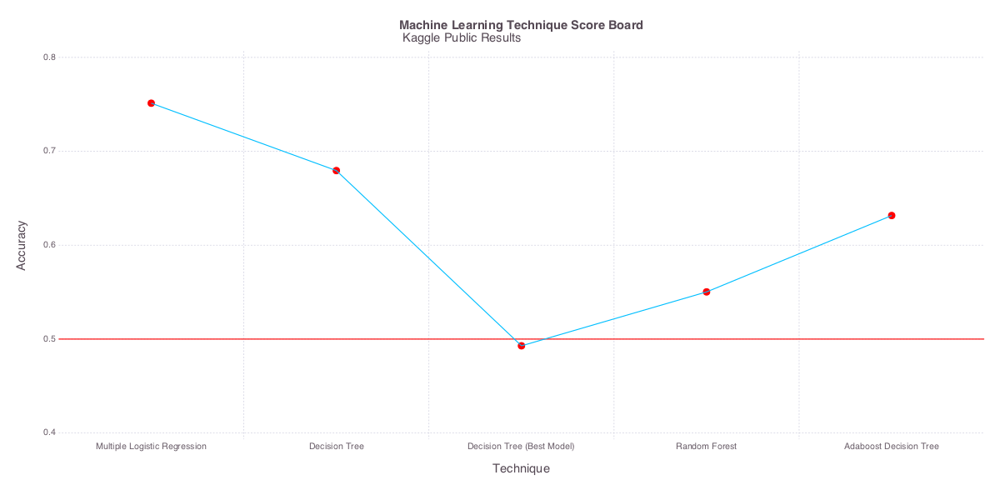

 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:46
 in call at /Users/diego/.julia/v0.4/Gadfly/src/coord.jl:43
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:507
 in render at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:781
 in writemime at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:909
 in sprint at iostream.jl:206
 in display_dict at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:39
 in execute_request_0x535c5df2 at /Users/diego/.julia/v0.4/IJulia/src/execute_request.jl:212
 in eventloop at /Users/diego/.julia/v0.4/IJulia/src/IJulia.jl:141
 in anonymous at task.jl:447
while loading /Users/diego/.julia/v0.4/IJulia/src/kernel.jl, in expression starting on line 31
 in depwarn at deprecated.jl:73
 in call at deprecated.jl:50
 in default_statistic at /Users/diego/.julia/v0.4/Gadfly/src/guide.jl:557
 in render_prepare at /Users/diego/.julia/v0.4/Gadfly/src/Gadfly.jl:669
 in render at /Us

In [210]:
acc = [0.75120, 0.67943, 0.49282, 0.55024, 0.63158]
mltech = ["Multiple Logistic Regression", "Decision Tree", "Decision Tree (Best Model)", "Random Forest", "Adaboost Decision Tree"]
plot(layer(x=mltech, y=acc, Geom.line),
     layer(x=mltech, y=acc, Geom.point, Theme(default_color=colorant"red", default_point_size=5px)),
     layer(yintercept=[.5], Geom.hline, Theme(default_color=colorant"red")),
     Scale.x_discrete,
     Guide.title("<b>Machine Learning Technique Score Board</b>\n Kaggle Public Results"), 
     Guide.xlabel("Technique"), Guide.ylabel("Accuracy"))

## Conclusions

This was a second attempt to use machine learning algorithms in Julia inside a Kaggle Competition. We are far from the best result, but we will in the notebook v3 and beyond explore new techniques that can improve the results. Lets keep forward!

In [211]:
HTML("""<script> 
    out = document.getElementsByClassName("output_stderr")
    for (i in out) { 
        out[i].style.display = "None";
    } </script>""");